<a href="https://colab.research.google.com/github/CA683-Group99/Wind-Energy-Prediction/blob/main/4_IslandElectricityRandomForestModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import io
import requests


from plotly.offline import iplot
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

from datetime import tzinfo, timedelta, datetime, date

# Any results you write to the current directory are saved as output.

import plotly.express as px
import seaborn as sns

In [2]:
!pip install --upgrade scikit-learn

Requirement already up-to-date: scikit-learn in /usr/local/lib/python3.7/dist-packages (0.24.1)


# System Demand and Generation: Actual and Prediction

### Data description
* **System Demand** - represents the predicted electricity production required to meet national consumption.

* **date** - 
* **REGION** - All / Ireland / Nrthern Ireland
* **ActualDemandMW** - Unit MW
* **ForecastDemandMW** - 
* **ForecastWindMW** - 
* **ActualWindMW** - 
* **ActualGenerationMW** - 
* **hour** - 
* **isweekday** - 
* **month** - 
  
Actual and forecast System Demand are shown in **15 minute intervals.**

The data came from EirGrid Group about all island power systems and has been prepared by us for further analysis.

Source: https://smartgriddashboard.eirgrid.com/#all/demand

# Load feature vector
 Weather data from weather stations: Belmullet (suffix _BEL), Dublin Airport (_DUB), Shannon Airport (No suffix) and Cork Airport (suffix _COR)

For each station, for example Cork Airport, please see the on https://data.gov.ie/dataset/cork-airport-hourly-data :

Hourly Elements:

| ID | ELEMENT | Unit |
| --- | --- | --- |       
|rain|Precipitation Amount|mm|
|**temp**|Air Temperature|°C|
| wetb|	Wet Bulb Air Temperature|  °C|
|dewpt| Dew Point Air Temperature|	°C	|	
|vappr|	Vapour Pressure	|		hpa|
|rhum	|	Relative Humidity	|	%|
|msl	|	Mean Sea Level Pressure				|		hPa|
|**wdsp**	|	Mean Hourly Wind Speed		|		kt|
|wddir|	Predominant Hourly wind Direction	|	kt|
|ww		Synop Code Present Weather - decode below
|w		Synop Code Past Weather - decode below
|sun		Sunshine duration						hours
|vis		Visibility							m
|clht		Cloud Ceiling Height - if none value is 999			100s feet
|clamt		Cloud Amount							okta

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import os
os.chdir('/content/drive/MyDrive/CA683Project')


In [5]:
fileP = 'IslandElectricity2017_2020v4.csv'
newdf = pd.read_csv(fileP, parse_dates=[1], na_values=" ")

latestWindCapacityMW = newdf['TotalWindCapacityMW'].max()

In [6]:
#Krystian: Looking for maximal extreme values
print('-----------DATA SIZE -------------')
print(newdf.shape)           # 10 Columns, 35044 rows
count_row = newdf.shape[0]   # 10 Columns
count_col = newdf.shape[1]   # 35044 rows
print('Rows: ', count_row, ', Columns: ', count_col)

print('-----------DATA INFO -------------')
print(newdf.info())

print('-----------DATA MAX Values -------------')
newdf.max()

print('-----------DATA COLUMNS-------------')
columns = newdf.columns.values.tolist()
print (columns)

print('-----------BASIC STATISTICS-------------')
newdf.describe()

-----------DATA SIZE -------------
(32136, 94)
Rows:  32136 , Columns:  94
-----------DATA INFO -------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32136 entries, 0 to 32135
Data columns (total 94 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Unnamed: 0           32136 non-null  int64         
 1   date                 32136 non-null  datetime64[ns]
 2   ind_BEL              32136 non-null  int64         
 3   rain_BEL             32136 non-null  float64       
 4   ind.1_BEL            32136 non-null  int64         
 5   temp_BEL             32136 non-null  float64       
 6   ind.2_BEL            32136 non-null  int64         
 7   wetb_BEL             32136 non-null  float64       
 8   dewpt_BEL            32136 non-null  float64       
 9   vappr_BEL            32136 non-null  float64       
 10  rhum_BEL             32136 non-null  int64         
 11  msl_BEL              32136 non-null

,Unnamed: 0,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,ind.3_BEL,wdsp_BEL,ind.4_BEL,wddir_BEL,ww_BEL,w_BEL,sun_BEL,vis_BEL,clht_BEL,clamt_BEL,ind_DUB,rain_DUB,ind.1_DUB,temp_DUB,ind.2_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,ind.3_DUB,wdsp_DUB,ind.4_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,...,wdsp,ind.4,wddir,ww,w,sun,vis,clht,clamt,ind_COR,rain_COR,ind.1_COR,temp_COR,ind.2_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,ind.3_COR,wdsp_COR,ind.4_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,month,year,TotalWindCapacityMW
count,32136.000000,32136.0,32136.000000,32136.0,32136.000000,32136.0,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.0,32136.000000,32136.0,32136.000000,0.0,0.0,0.0,0.0,0.0,0.0,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32052.000000,32052.000000,32136.000000,32136.0,32136.000000,32136.000000,32135.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,...,32136.000000,32136.0,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32052.000000,32052.000000,32136.000000,32136.0,32136.000000,32136.0,32136.000000,32136.000000,32136.000000,32136.000000,32134.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000
mean,16067.500000,0.0,0.164712,0.0,10.373562,0.0,8.976537,7.390830,10.669318,82.046832,1011.091688,2.0,12.236090,2.0,201.229773,NaN,NaN,NaN,NaN,NaN,NaN,0.481485,0.089949,0.020942,9.794007,0.031522,8.305038,6.652496,10.213260,81.935854,1012.612880,2.0,9.811209,2.000156,207.655516,15.121982,29.825523,0.162979,27910.191063,288.130072,...,9.182070,2.0,193.265497,18.070606,35.669841,0.153964,22181.080408,281.377738,5.666169,0.678740,0.153613,0.008526,9.980813,0.042289,8.533041,7.576304,10.858617,86.039748,1013.488748,2.0,9.916604,2.0,214.841299,17.345563,32.903846,0.169414,28135.148441,286.156865,5.589619,16067.500000,4213.433431,1410.427324,1372.008472,4255.746048,-11.428009,32.938907,11.500000,6.707991,2018.814040,5009.629385
std,9277.008462,0.0,0.517029,0.0,3.996363,0.0,3.798958,4.242203,3.011946,10.997996,13.367484,0.0,6.698996,0.0,92.285335,NaN,NaN,NaN,NaN,NaN,NaN,0.964162,0.424251,0.143193,5.102580,0.176499,4.506006,4.553134,3.156843,12.034440,12.682835,0.0,4.810974,0.027892,80.979749,22.974468,27.028785,0.318781,13660.864219,399.910817,...,5.280982,0.0,86.777755,23.689797,29.224839,0.313977,12486.633522,408.467535,2.418876,1.163435,0.569093,0.091945,4.633844,0.386546,6.012028,4.487369,3.242104,12.090678,12.396950,0.0,5.170618,0.0,83.475835,23.552764,27.951275,0.331621,18072.163471,419.024988,2.396005,9277.008462,848.776649,1094.062884,987.325954,753.511004,526.517442,23.152582,6.922294,3.528963,1.112341,446.423214
min,0.000000,0.0,0.000000,0.0,-3.300000,0.0,-4.400000,-9.700000,2.900000,35.000000,959.100000,2.0,0.000000,2.0,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,-5.600000,0.000000,-49.900000,-8.900000,3.100000,25.000000,965.900000,2.0,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,...,0.000000,2.0,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-6.900000,0.000000,-49.000000,-9.200000,3.100000,26.000000,970.100000,2.0,0.000000,2.0,0.000000,1.000000,0.000000,0.000000,15.000000,1.000000,0.000000,0.000000,2394.750000,0.000000,-44.750000,1939.250000,-1415.000000,-0.943098,0.000000,1.000000,2017.000000,4096.494000
25%,8033.750000,0.0,0.000000,0.0,7.575000,0.0,6.200000,4.200000,8.300000,75.000000,1002.400000,2.0,7.000000,2.0,150.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,6.200000,0.000000

In [7]:
import plotly.express as px

fig = px.scatter(newdf, x='date', y='msl')
fig.show()

In [8]:
eirgridCols = ['ActualDemandMW', 'ActualGenerationMW' , 'ForecastWndMW' , 'ActualWindMW', 'NetTotal_MW' ]
len(eirgridCols)

5

In [9]:

fig = make_subplots(
    rows=len(eirgridCols), cols=1,
    subplot_titles=(eirgridCols ))
i =1 

fig.print_grid 
for col in eirgridCols:
  missingAW = newdf.loc[newdf[col].isnull() == True]
  #fig = px.scatter(missingAW, x='date', y='hour')
  fig.add_trace(go.Scatter(x=missingAW.date, y=missingAW['hour'], name=(col),  hovertext='label'), i, 1, secondary_y=False)
  i = i+1

fig.update_layout(height=800, width=1200)
fig.show()

In [10]:
fig = go.Figure()
for col in eirgridCols:
  fig.add_trace(go.Box(y=newdf[col], name=col))
fig.show()

Will need to tidy up null values properly!

In [11]:
newdf.loc[newdf['month'].isnull() == True]

,Unnamed: 0,date,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,ind.3_BEL,wdsp_BEL,ind.4_BEL,wddir_BEL,ww_BEL,w_BEL,sun_BEL,vis_BEL,clht_BEL,clamt_BEL,ind_DUB,rain_DUB,ind.1_DUB,temp_DUB,ind.2_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,ind.3_DUB,wdsp_DUB,ind.4_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,...,ind.4,wddir,ww,w,sun,vis,clht,clamt,ind_COR,rain_COR,ind.1_COR,temp_COR,ind.2_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,ind.3_COR,wdsp_COR,ind.4_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year,TotalWindCapacityMW


In [12]:
newdf = newdf.loc[newdf['month'].isnull() == False]

In [13]:
newdf.loc[newdf['ActualWindMW'] < 0]

,Unnamed: 0,date,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,ind.3_BEL,wdsp_BEL,ind.4_BEL,wddir_BEL,ww_BEL,w_BEL,sun_BEL,vis_BEL,clht_BEL,clamt_BEL,ind_DUB,rain_DUB,ind.1_DUB,temp_DUB,ind.2_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,ind.3_DUB,wdsp_DUB,ind.4_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,...,ind.4,wddir,ww,w,sun,vis,clht,clamt,ind_COR,rain_COR,ind.1_COR,temp_COR,ind.2_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,ind.3_COR,wdsp_COR,ind.4_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year,TotalWindCapacityMW
275,275,2017-07-12 11:00:00,0,0.0,0,17.4,0,13.6,10.2,12.4,62,1019.5,2,7,2,40,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,17.7,0,14.6,12.1,14.1,70.0,1019.1,2,5,2,20.0,2,11,0.7,30000,...,2,220,2,11,1.0,60000,250,6,0,0.0,0,17.4,0,12.7,8.2,10.9,55.0,1019.2,2,4,2,310,2,11,1.0,65000.0,250,5,275.0,4326.25,15.00,-1.50,4124.25,90.75,-0.034672,11.0,True,7.0,2017.0,4096.494
2987,2987,2017-11-02 11:00:00,0,0.0,0,10.9,0,9.0,6.9,10.0,76,1018.2,2,4,2,160,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,9.9,0,8.1,5.9,9.4,77.0,1017.7,2,6,2,320.0,2,11,0.0,30000,...,2,30,2,11,0.0,50000,31,7,0,0.0,0,10.9,0,10.7,10.5,12.7,97.0,1017.8,2,3,2,340,2,11,0.1,15000.0,3,7,2987.0,4995.75,20.50,-2.25,4013.25,935.75,-0.045038,11.0,True,11.0,2017.0,4299.497
2988,2988,2017-11-02 12:00:00,0,0.0,0,11.2,0,8.8,6.0,9.4,70,1017.9,2,5,2,180,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,10.3,0,8.0,5.2,8.9,71.0,1017.5,2,5,2,310.0,2,11,0.0,30000,...,2,30,2,11,0.0,40000,30,7,0,0.0,0,11.1,0,10.6,10.1,12.4,94.0,1017.5,2,2,2,10,2,11,0.0,25000.0,8,7,2988.0,5025.75,11.75,-3.25,4025.25,961.50,-0.064667,12.0,True,11.0,2017.0,4299.497
2989,2989,2017-11-02 13:00:00,0,0.0,0,11.2,0,8.3,5.0,8.7,65,1017.5,2,4,2,180,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,10.3,0,7.4,3.7,8.0,64.0,1017.2,2,6,2,330.0,2,11,0.0,30000,...,2,10,2,11,0.1,40000,31,7,0,0.0,0,12.1,0,10.9,9.7,12.1,86.0,1017.1,2,3,2,40,2,11,0.0,25000.0,16,7,2989.0,4955.50,10.50,-2.00,3993.00,926.00,-0.040359,13.0,True,11.0,2017.0,4299.497
8241,8241,2018-06-09 09:00:00,0,0.0,0,14.7,0,12.3,10.1,12.3,73,1017.5,2,5,2,320,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,19.0,0,14.7,11.2,13.3,60.0,1016.5,2,5,2,130.0,2,11,1.0,17000,...,2,310,10,42,0.0,13000,7,8,0,0.0,0,18.0,0,15.1,12.9,14.8,72.0,1016.1,2,3,2,30,2,11,1.0,20000.0,999,1,8241.0,4107.25,37.50,-0.50,3905.75,134.25,-0.012174,9.0,False,6.0,2018.0,4626.700
8242,8242,2018-06-09 10:00:00,0,0.0,0,15.1,0,12.1,9.3,11.7,68,1017.5,2,4,2,340,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,19.8,0,15.0,11.1,13.2,57.0,1016.4,2,7,2,100.0,5,0,1.0,15000,...,2,10,2,11,0.0,16000,10,8,0,0.0,0,19.2,0,15.9,13.4,15.4,69.0,1015.9,2,4,2,80,2,11,1.0,20000.0,999,4,8242.0,4222.50,31.75,-0.25,3785.75,306.50,-0.005921,10.0,False,6.0,2018.0,4626.700
9605,9605,2018-08-05 05:00:00,0,0.0,0,12.8,0,11.6,10.5,12.7,85,1023.1,2,6,2,190,NaN,NaN,NaN,NaN,NaN,NaN,3,0.0,0,13.6,0,12.8,12.1,14.1,91.0,1024.2,2,1,2,220.0,2,11,0.0,30000,...,2,200,2,11,0.0,40000,32,7,0,0.0,0,13.8,0,12.6,11.6,13.6,86.0,1024.5,2,3,2,320,2,11,0.0,50000.0,21,7,9605.0,2676.75,45.00,-1.25,3162.00,-363.00,-0.046698,5.0,False,8.0,2018.0,4770.848
27297,27297,2020-08-11 09:00:00,0,0.0,0,17.7,0,16.1,15.0,17.1,84,1017.9,2,2,2,30,NaN,NaN,NaN,NaN,NaN,NaN,3,0.1,0,15.6,0,15.5,15.5,17.5,99.0,1017.4,2,4,2,350.0,28,42,0.0,2500,...,2,280,10,22,0.1,7000,28,7,0,0.0,0,17.1,0,14.8,13.1,15.0,77.0,1017.4,2,5,2,330,10,42,1.0,15000.0,10,5,27297.0,4631.00,163.25,-12.75,4099.00,509.00,-0.275319,9.0,True,8.0,2020.0,5531.095
27298,27298,2020-08-11 10:00:00,0,0.0,0,18.7,0,16.9,15.6,17.7,82,1017.7,2,4,2,10,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,16.4,0,16.1,15.9,18.0,97.0,1017.6,2,4,2,10.0,10,22,0.0,2500,...,2,300,10,22,0.1,9000,29,7,0,0.0,0,17.9,0,15.6,13.8,15.9,77.0,1017.3,2,5,2,340,2,11,1.0,30000.0,999,4,27298.0,4710.50,130.50,-13.25,4149.25,557.00,-0.281286,10.0,True,8.0,2020.0,5531.095
27299,27299,2020-08-11 11:00:00,0,0.0,0,19.7,0,17.1,15.3,17.4,75,1017

In [14]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='month', color='isweekday')
fig.show()

In [15]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='year', color='isweekday')
fig.show()

In [16]:
newdf['WindGenPercent'] = (newdf['ActualWindMW'] / newdf['ActualGenerationMW']) * 100
fig = px.scatter(newdf, x='hour', y='WindGenPercent', facet_col='year')
fig.show()

# Prep smaller dataset to run model : reduced dataset for prototype to known important factors

In [17]:
newdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32136 entries, 0 to 32135
Data columns (total 95 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Unnamed: 0           32136 non-null  int64         
 1   date                 32136 non-null  datetime64[ns]
 2   ind_BEL              32136 non-null  int64         
 3   rain_BEL             32136 non-null  float64       
 4   ind.1_BEL            32136 non-null  int64         
 5   temp_BEL             32136 non-null  float64       
 6   ind.2_BEL            32136 non-null  int64         
 7   wetb_BEL             32136 non-null  float64       
 8   dewpt_BEL            32136 non-null  float64       
 9   vappr_BEL            32136 non-null  float64       
 10  rhum_BEL             32136 non-null  int64         
 11  msl_BEL              32136 non-null  float64       
 12  ind.3_BEL            32136 non-null  int64         
 13  wdsp_BEL             32136 non-

In [18]:
import seaborn as sns

def corrHeatMap(redds):
  num_df = redds.select_dtypes(['int', 'float'])
  # Compute the correlation matrix
  corr = num_df.corr()
  corr = np.round(corr, 3)
  # Generate a mask for the upper triangle
  mask = np.triu(np.ones_like(corr, dtype=np.bool))

  # Set up the matplotlib figure
  f, ax = plt.subplots(figsize=(11, 9))

  # Generate a custom diverging colormap
  cmap = sns.diverging_palette(220, 10, as_cmap=True)

  # Draw the heatmap with the mask and correct aspect ratio
  sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.6, center=0, annot= True,
              square=True, linewidths=.5, cbar_kws={"shrink": .5})


In [19]:
weatherBaseFeatures = ['wdsp', 'wddir', 'msl', 'temp']
stationsCode = ['', '_BEL', '_COR', '_DUB']
stationsName = ['Shannon', 'Belmullet', 'Cork Airport', 'Dublin Airport']

weatherFeatures = []
for feat in weatherBaseFeatures:
  for code in stationsCode:
    weatherFeatures.append(feat + code)

winda = weatherFeatures.copy()
winda.append('ActualWindMW')

redds = newdf.loc[:, winda]
redds.isnull().sum()

wdsp            0
wdsp_BEL        0
wdsp_COR        0
wdsp_DUB        0
wddir           0
wddir_BEL       0
wddir_COR       0
wddir_DUB       1
msl             0
msl_BEL         0
msl_COR         0
msl_DUB         0
temp            0
temp_BEL        0
temp_COR        0
temp_DUB        0
ActualWindMW    0
dtype: int64

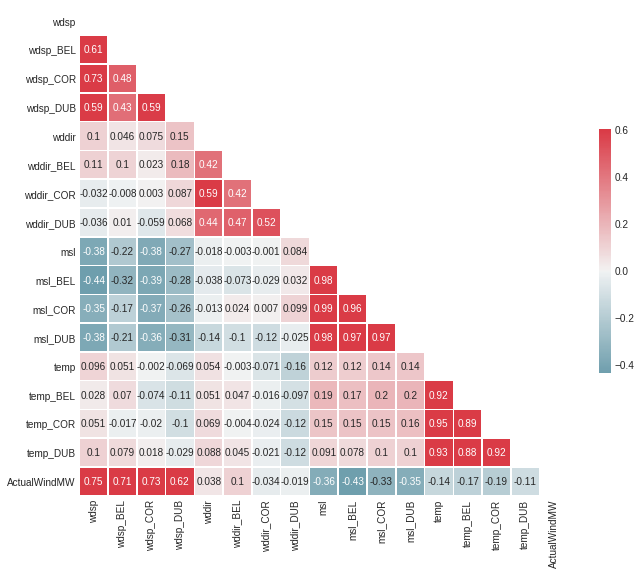

In [20]:
corrHeatMap(redds)

- Wind generation highly correlated with Wind Speed.
- Air pressure (msl) inverse correlated with power  
- Temperature and msl Features accross stations highly correlated

In [21]:
redds = newdf.loc[:, ['wdsp']]
redds['wdsp_2'] = np.power(redds['wdsp'], 2)
redds['wdsp_3'] = np.power(redds['wdsp'], 3)

redds['wddir'] = newdf['wddir']
redds['windsin'] = redds['wdsp'] * np.sin(redds['wddir'])
redds['windcos'] = redds['wdsp'] * np.cos(redds['wddir'])

redds['ActualWindMW'] = newdf['ActualWindMW']

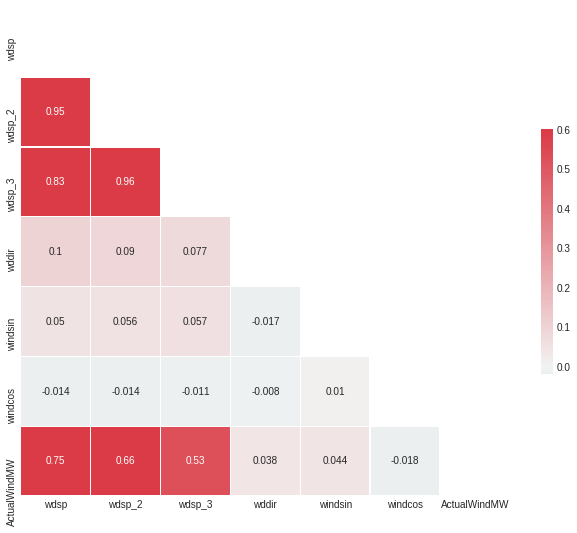

In [22]:
corrHeatMap(redds)

- ActualWind most correlated to wdsp

## Check colinearity in candidates features

In [23]:
redds = newdf.loc[:, ['date', 'hour', 'isweekday', 'month', 'year',
                      'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
                      'wdsp', 'wddir', 'temp',
                      'wdsp_COR', 'wddir_COR',  'temp_COR',
                      'wdsp_DUB', 'wddir_DUB',  'temp_DUB', 'msl',
                      'TotalWindCapacityMW', 'ActualWindMW', 'ForecastWndMW', 'ActualDemandMW']]

In [24]:
redds.isnull().sum()

date                   0
hour                   0
isweekday              0
month                  0
year                   0
wdsp_BEL               0
wddir_BEL              0
temp_BEL               0
wdsp                   0
wddir                  0
temp                   0
wdsp_COR               0
wddir_COR              0
temp_COR               0
wdsp_DUB               0
wddir_DUB              1
temp_DUB               0
msl                    0
TotalWindCapacityMW    0
ActualWindMW           0
ForecastWndMW          0
ActualDemandMW         0
dtype: int64

In [25]:
# Backfill for the few missing points (up to 4 in a row )
redds.fillna(method='ffill', limit=4, inplace=True)
redds.isweekday = redds.isweekday.astype('bool')

## Check colinearity in candidates features: Correlation matrix and VIF


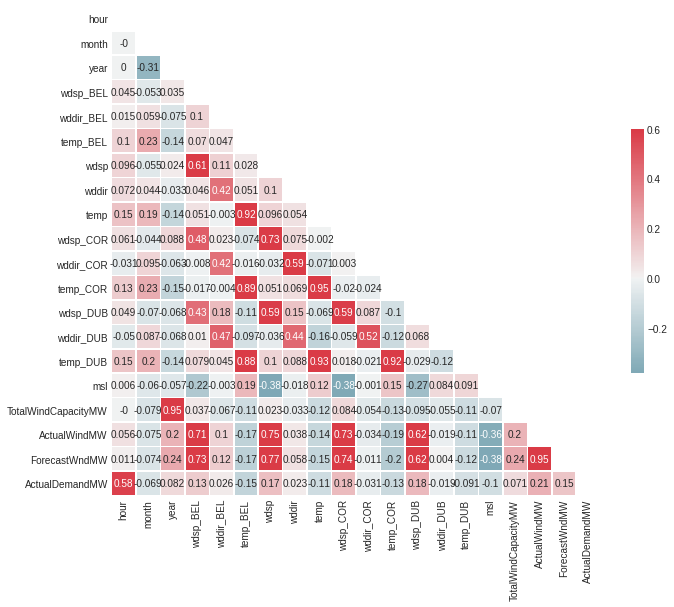

In [26]:
corrHeatMap(redds)

In [27]:
X = redds[['hour', 'month', 'year',
                      'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
                      'wdsp', 'wddir', 'temp',  
                      'wdsp_COR', 'wddir_COR',  'temp_COR',
                      'wdsp_DUB', 'wddir_DUB',  'temp_DUB', 'msl',
           'TotalWindCapacityMW']]

In [28]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
from statsmodels.api import add_constant

#X = redds[['wdsp_BEL', 'wddir_BEL', 'temp_BEL', 'wdsp', 'wddir', 'temp','wdsp_COR', 'wddir_COR',  'temp_COR','wdsp_DUB', 'wddir_DUB',  'temp_DUB']]
X = add_constant(X)

vif = [variance_inflation_factor(X.to_numpy(), i) for i in range(X.to_numpy().shape[1])]

print(vif[1:])


[1.0540917405375854, 2.837478047591531, 27.5468841378201, 1.7640933455898649, 1.4835447333750604, 7.9115307458564725, 3.03798206905213, 1.7688883985377915, 17.000677448188696, 2.510863148066089, 1.8893316280175285, 12.705665179666175, 1.8764382556739694, 1.677663393463646, 8.906922341116598, 1.3303389547493725, 25.208915559133683]


In [29]:
pd.DataFrame(X.iloc[:, 1:].columns, vif[1:])

,0
1.054092,hour
2.837478,month
27.546884,year
1.764093,wdsp_BEL
1.483545,wddir_BEL
7.911531,temp_BEL
3.037982,wdsp
1.768888,wddir
17.000677,temp
2.510863,wdsp_COR


 ## Drop temp_COR, Temp and year (TotalWindCapacityMW has more info) as too correlated to Dublin temp


In [30]:
X.drop(['temp_COR'], axis=1, inplace=True)
X.drop(['temp'], axis=1, inplace=True)
X.drop(['year'], axis=1, inplace=True)

vif = [variance_inflation_factor(X.to_numpy(), i) for i in range(X.to_numpy().shape[1])]

print(vif[1:])
pd.DataFrame(X.iloc[:, 1:].columns, vif[1:])

[1.0433607454906721, 1.1134626077077263, 1.6453344692496938, 1.4652592409879146, 5.137078174557502, 2.9679266990868594, 1.754566017652627, 2.4834643598866597, 1.8558404668955104, 1.8466904390064784, 1.6583606565281526, 4.950939813215306, 1.3093248248155829, 1.068694009356026]


,0
1.043361,hour
1.113463,month
1.645334,wdsp_BEL
1.465259,wddir_BEL
5.137078,temp_BEL
2.967927,wdsp
1.754566,wddir
2.483464,wdsp_COR
1.855840,wddir_COR
1.846690,wdsp_DUB


In [31]:
redds.drop(['temp_COR'], axis=1, inplace=True)
redds.drop(['temp'], axis=1, inplace=True)
redds.drop(['year'], axis=1, inplace=True)

# Split data into Training (day of month between 1st and 21st) and Validation (day of the months above 22nd) sets and run Random Forest 

In [32]:
def setdayatt(row):
    row["day"] = row.date.day
    return row

redds["day"] = 0
redds = redds.apply(setdayatt, axis='columns')



In [33]:
from sklearn.model_selection import train_test_split

# Split train vs. Test for day of the month <> 23 to avoid overfitting
X_train_full = redds.loc[(redds.day > 0) & (redds.day < 23), :]
X_valid_full = redds.loc[(redds.day >= 23), :]

y_train = X_train_full.ActualWindMW
X_train_full.drop(['ActualWindMW', 'ActualDemandMW', 'ForecastWndMW', 'day'], axis=1, inplace=True)

y_valid = X_valid_full.ActualWindMW
X_valid_full.drop(['ActualWindMW', 'ActualDemandMW', 'ForecastWndMW', 'day'], axis=1, inplace=True)

# Break off validation set from training data
#X_train_full, X_valid_full, y_train, y_valid = train_test_split(redds, y, train_size=0.8, test_size=0.2,random_state=0)

# "Cardinality" means the number of unique values in a column
# Select categorical columns with relatively low cardinality (convenient but arbitrary)
categorical_cols = [cname for cname in X_train_full.columns if
                    X_train_full[cname].nunique() < 10 and 
                    X_train_full[cname].dtype == "object"]

# Select numerical columns
numerical_cols = [cname for cname in X_train_full.columns if 
                X_train_full[cname].dtype in ['int64', 'float64', 'bool']]

# Keep selected columns only
my_cols = categorical_cols + numerical_cols
X_train = X_train_full[my_cols].copy()
X_valid = X_valid_full[my_cols].copy()


In [34]:
y_train.shape , X_train.shape, y_valid.shape, X_valid.shape

((23232,), (23232, 15), (8904,), (8904, 15))

In [35]:
redds[['date', 'ActualWindMW']].tail(24*6 + 3)


,date,ActualWindMW
31989,2021-02-22 21:00:00,3928.00
31990,2021-02-22 22:00:00,3669.25
31991,2021-02-22 23:00:00,3450.75
31992,2021-02-23 00:00:00,3288.00
31993,2021-02-23 01:00:00,3307.75
...,...,...
32131,2021-02-28 19:00:00,571.75
32132,2021-02-28 20:00:00,809.75
32133,2021-02-28 21:00:00,976.75
32134,2021-02-28 22:00:00,1039.25


In [36]:
y_valid.tail(24*6 + 3)

31461    1765.50
31462    1618.00
31463    1525.00
31992    3288.00
31993    3307.75
          ...   
32131     571.75
32132     809.75
32133     976.75
32134    1039.25
32135    1034.00
Name: ActualWindMW, Length: 147, dtype: float64

In [37]:
X_train.columns

Index(['hour', 'isweekday', 'month', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
       'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB',
       'temp_DUB', 'msl', 'TotalWindCapacityMW'],
      dtype='object')

## Run model with Performance metrics :  mean_absolute_error, mean_squared_error, r2_score

In [38]:
#from sklearn.metrics import mean_absolute_percentage_error

In [39]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score 

# Preprocessing for numerical data
numerical_transformer = SimpleImputer(strategy='constant')

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Define model
model = RandomForestRegressor(n_estimators=200, random_state=0)

# Bundle preprocessing and modeling code in a pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('model', model)
                     ])



In [40]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

In [41]:
# Preprocessing of training data, fit model 
clf.fit(X_train, y_train)

# Preprocessing of validation data, get predictions
preds = clf.predict(X_valid)

print('MAE:', mean_absolute_error(y_valid, preds))
#print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_valid, preds))
print('RMSE:', np.sqrt(mean_squared_error(y_valid, preds))) 
print('Test r2_score:', r2_score(y_valid, preds))

MAE: 275.707651336478
RMSE: 365.5619001944772
Test r2_score: 0.8504257236639098


In [42]:
validLen = y_valid.shape[0]
preds.shape[0], y_valid.shape[0]

(8904, 8904)

## Metrics for last week to compare

In [43]:
X_validPreds = X_valid.copy()
X_validPreds['preds'] = preds
X_validPreds['actual'] = y_valid

X_validPreds['date'] = X_valid_full['date']
X_validPreds['ForecastWndMW'] = redds['ForecastWndMW']

In [44]:
weekValidPred = X_validPreds[-6*24:]


In [45]:


fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))


fig.add_trace(go.Scatter(x=weekValidPred['date'], y=weekValidPred.actual,
                    mode='lines',
                    name='Wind Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=weekValidPred['date'], y=weekValidPred.preds,
                    mode='lines',
                    name='RF Pred',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=weekValidPred['date'], y=weekValidPred.ForecastWndMW,
                    mode='lines',
                    name='Eirgrid Pred',showlegend=True), 1, 1, secondary_y=False)
fig.show()

In [46]:
print('Eirgrid Wind Forecast Week MAE:', np.round(mean_absolute_error(weekValidPred.actual, weekValidPred.ForecastWndMW ),1))
print('Eirgrid Wind Forecast Week RMSE:', np.round(np.sqrt(mean_squared_error(weekValidPred.actual, weekValidPred.ForecastWndMW)), 1)) 
print('Eirgrid Wind Forecast Week Train r2_score:', r2_score(weekValidPred.actual, weekValidPred.ForecastWndMW))
print("---------------------")
print('RF Week MAE:', np.round(mean_absolute_error(weekValidPred.actual, weekValidPred.preds ), 1))
print('RF Week RMSE:', np.round(np.sqrt(mean_squared_error(weekValidPred.actual, weekValidPred.preds)), 1)) 
print('RF Week Train r2_score:', r2_score(weekValidPred.actual, weekValidPred.preds))

Eirgrid Wind Forecast Week MAE: 426.4
Eirgrid Wind Forecast Week RMSE: 637.8
Eirgrid Wind Forecast Week Train r2_score: 0.6985319926759079
---------------------
RF Week MAE: 276.6
RF Week RMSE: 344.3
RF Week Train r2_score: 0.9121432570671667


In [47]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))

fig.add_trace(go.Scatter(x=redds['date'], y=redds['ForecastWndMW'],
                    mode='lines',
                    name='Eirgrid Forecast Wnd',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=redds['date'], y=redds['ActualDemandMW'],
                    mode='lines',
                    name='Demand Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=redds['date'], y=redds['ActualWindMW'],
                    mode='lines',
                    name='Wind Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=X_valid_full['date'], y=preds,
                    mode='lines',
                    name='Pred',showlegend=True), 1, 1, secondary_y=False)


fig.update_layout(
    title_text="Wind actual (blue) vs. Predictions (red) for days 22nd and above each month",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=4000,
    height=500
)
fig.show()

## Model features importance

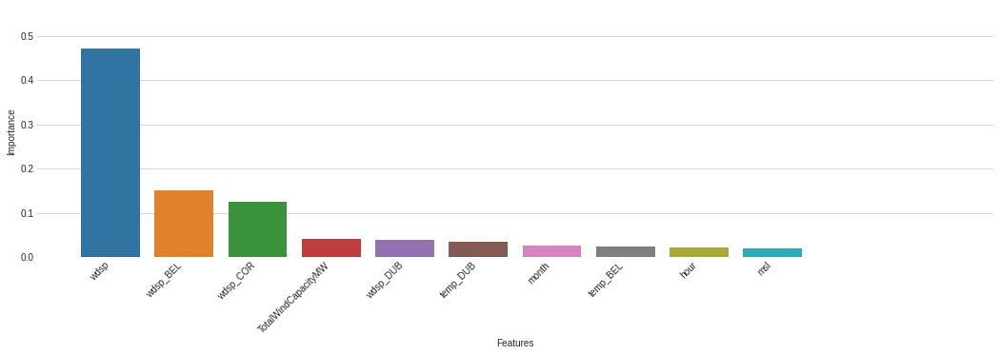

In [48]:
X_cols = X_valid.columns

rfc_fi = pd.DataFrame({'cols':X_cols, 'imp':model.feature_importances_}
                       ).sort_values('imp', ascending=False)

f, ax = plt.subplots(figsize=(18, 5))

chart = sns.barplot(x="cols", y="imp", data=(rfc_fi.loc[rfc_fi.imp > 0.015]))

# Add a legend and informative axis label
ax.set(xlim=(-1, 12), ylabel="Importance",
       xlabel="Features")
sns.despine(left=True, bottom=True)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')

# Pad margins so that markers don't get clipped by the axes
plt.margins(0.2)
# Tweak spacing to prevent clipping of tick-labels
plt.subplots_adjust(bottom=0.15)
plt.show()

# Met Éireann Weather Forecast API
Published by: Met Éireann
 32 
Licensed under: Met Eireann Custom Open Data Licence
https://data.gov.ie/dataset/met-eireann-weather-forecast-api/resource/027da6d5-d819-48d1-9b16-331dba169bd1

In [49]:

from xml.dom.minidom import parse
import xml.dom.minidom


In [50]:
def getWeather(lat, long, name):

    url = "http://metwdb-openaccess.ichec.ie/metno-wdb2ts/locationforecast?lat={};long={}".format(lat, long)
    s = requests.get(url).content

    DOMTree = xml.dom.minidom.parse(io.StringIO(s.decode('utf-8')))

    collection = DOMTree.documentElement
    if collection.hasAttribute("shelf"):
       print ("Root element : ", collection.getAttribute("shelf"))

    # Get all the movies in the collection
    product = collection.getElementsByTagName("product")

    df_cols = ['date', 'wddir', 'wdsp', 'temp', 'msl']
    rows = []

    product = collection.getElementsByTagName("product")
    timefcs = collection.getElementsByTagName("time")


    # Print detail of each movie.
    for timefc in timefcs:
        if timefc.hasAttribute("from"):
            fromtime =""
            wdeg = None
            wsp = None
            temp = None
            msl = None

            #print ("from: ", timefc.getAttribute("from"))
            fromtime = timefc.getAttribute("from")

            location = timefc.getElementsByTagName('location')[0]

            if (len(location.getElementsByTagName('windDirection')) > 0 ):
                wd = location.getElementsByTagName('windDirection')[0]
                if wd.hasAttribute("deg"):
                    wdeg = float(wd.getAttribute("deg"))
                    #print ("Wi)nd Direction deg: ", wd.getAttribute("deg"))    

            if (len(location.getElementsByTagName('windSpeed')) > 0):
                wsp = location.getElementsByTagName('windSpeed')[0]
                if wsp.hasAttribute("mps"):
                    wsp = float(wsp.getAttribute("mps"))

            if (len(location.getElementsByTagName('pressure')) > 0):
                msl = location.getElementsByTagName('pressure')[0]
                if msl.hasAttribute("value"):
                    msl = float(msl.getAttribute("value"))

            if (len(location.getElementsByTagName('temperature')) > 0):
                temp = location.getElementsByTagName('temperature')[0]
                if temp.hasAttribute("value"):
                    temp = float(temp.getAttribute("value"))
        #print ("From: " + fromtime + " Wind Direction deg: " + str(wdeg) + " Wind Speed mps: " + str(wsp))    
        if (wdeg != None):
            rows.append({"date": fromtime, "wddir": wdeg, "wdsp": wsp, "temp": temp, "msl": msl})


    # <windDirection id="dd" deg="348.0" name="N"/>
    # <windSpeed id="ff" mps="3.2" beaufort="2" name="Svak vind"/>


    out_df = pd.DataFrame(rows, columns = df_cols)
    
    out_df["date"] = pd.to_datetime(out_df["date"], infer_datetime_format=True, errors='ignore')

    #out_df.to_csv(name + "weather.csv")

    return out_df

In [51]:
# Belmullet: 54.225, -9.991
lat=54.225
long=-9.991

BELMULLETds = getWeather(lat, long, "Belmullet")

In [52]:
BELMULLETds

,date,wddir,wdsp,temp,msl
0,2021-03-26 16:00:00,267.0,13.4,7.0,1000.7
1,2021-03-26 17:00:00,264.5,12.0,6.2,1001.7
2,2021-03-26 18:00:00,257.3,10.4,4.0,1002.8
3,2021-03-26 19:00:00,270.9,12.3,5.2,1003.7
4,2021-03-26 20:00:00,267.1,12.7,6.0,1004.4
...,...,...,...,...,...
104,2021-04-04 00:00:00,34.2,3.4,5.4,1038.5
105,2021-04-04 06:00:00,12.9,4.6,6.7,1036.6
106,2021-04-04 12:00:00,4.9,6.1,8.1,1035.3
107,2021-04-04 18:00:00,353.7,6.8,7.4,1032.0


In [53]:
# Cork Airport: 51.8382 Longitude: -8.4880
lat= 51.8382
long= -8.4880

corkairportds = getWeather(lat, long, "Cork")

In [54]:
# Shannon Airport, Ireland. Latitude: 52.7012 Longitude: -8.9215.
lat= 52.7012
long= -8.9215

shannonairportds = getWeather(lat, long, "Shannon")

In [55]:
# Dublin Airport in Ireland. Latitude: 53.4264 Longitude: -6.2499
lat= 53.4264
long= -6.2499

dublinairportds = getWeather(lat, long, "Dublin")

In [56]:
left = BELMULLETds.set_index(['date']).copy()
right = dublinairportds.set_index(['date'])
#right.index = right.index.tz_convert(None)

wfds = left.join(right, lsuffix="_BEL", rsuffix="_DUB")

right = shannonairportds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_SHA")

right = corkairportds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_COR")
wfds = wfds.reset_index()


In [57]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Met Station"))


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_BEL'],
                    mode='lines',
                    name='Belmullet Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_COR'],
                    mode='lines',
                    name='Cork Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp'],
                    mode='lines',
                    name='Shannon Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)
fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_DUB'],
                    mode='lines',
                    name='Dublin Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)


fig.update_layout(
    title_text="Wind speed ",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=500
)
fig.show()

In [58]:
# Weather Hourly data wind speed in knt, for some reason, 1 knt = 0.514 m/s
knot = 0.514
wfds.wdsp_BEL = wfds.wdsp_BEL / knot
wfds.wdsp = wfds.wdsp / knot
wfds.wdsp_COR = wfds.wdsp_COR / knot
wfds.wdsp_DUB = wfds.wdsp_DUB / knot


In [59]:
fig = go.Figure()
fig.add_trace(go.Box(y=newdf['wdsp_BEL'], name='BEL'))
fig.add_trace(go.Box(y=wfds['wdsp_BEL'], name='BEL forecast'))
fig.add_trace(go.Box(y=newdf['wdsp_DUB'], name = 'DUB'))
fig.add_trace(go.Box(y=wfds['wdsp_DUB'], name='DUB forecast'))
fig.add_trace(go.Box(y=newdf['wdsp'], name = 'SHA'))
fig.add_trace(go.Box(y=wfds['wdsp'], name='SHA forecast'))

fig.add_trace(go.Box(y=newdf['wdsp_COR'], name = 'CORK'))
fig.add_trace(go.Box(y=wfds['wdsp_COR'], name='CORK forecast'))
fig.show()

In [60]:
fig = go.Figure()
fig.add_trace(go.Box(y=newdf['msl_BEL'], name='BEL'))
fig.add_trace(go.Box(y=wfds['msl_BEL'], name='BEL forecast'))
fig.add_trace(go.Box(y=newdf['msl_DUB'], name = 'DUB'))
fig.add_trace(go.Box(y=wfds['msl_DUB'], name='DUB forecast'))
fig.add_trace(go.Box(y=newdf['msl'], name = 'SHA'))
fig.add_trace(go.Box(y=wfds['msl'], name='SHA forecast'))

fig.add_trace(go.Box(y=newdf['msl_COR'], name = 'CORK'))
fig.add_trace(go.Box(y=wfds['msl_COR'], name='CORK forecast'))
fig.show()

# Run predictions

In [61]:
wfds

,date,wddir_BEL,wdsp_BEL,temp_BEL,msl_BEL,wddir_DUB,wdsp_DUB,temp_DUB,msl_DUB,wddir,wdsp,temp,msl,wddir_COR,wdsp_COR,temp_COR,msl_COR
0,2021-03-26 16:00:00,267.0,26.070039,7.0,1000.7,220.7,18.287938,7.2,1000.8,269.5,21.789883,7.4,1005.2,272.0,18.093385,5.1,1008.1
1,2021-03-26 17:00:00,264.5,23.346304,6.2,1001.7,234.4,17.120623,5.5,1001.5,273.4,18.287938,4.4,1006.9,259.3,18.482490,4.2,1009.0
2,2021-03-26 18:00:00,257.3,20.233463,4.0,1002.8,262.4,16.731518,5.3,1003.4,251.4,18.871595,5.6,1007.8,272.9,16.147860,4.3,1010.4
3,2021-03-26 19:00:00,270.9,23.929961,5.2,1003.7,250.2,21.011673,4.5,1003.3,250.2,14.202335,3.5,1008.9,270.5,12.451362,2.9,1011.8
4,2021-03-26 20:00:00,267.1,24.708171,6.0,1004.4,250.6,22.568093,3.4,1005.4,245.7,16.147860,4.6,1009.6,236.6,13.424125,1.9,1012.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,2021-04-04 00:00:00,34.2,6.614786,5.4,1038.5,303.6,5.642023,2.7,1036.1,3.4,5.642023,4.8,1036.7,319.0,1.750973,3.0,1036.1
105,2021-04-04 06:00:00,12.9,8.949416,6.7,1036.6,294.5,6.809339,2.7,1033.8,353.6,4.474708,1.5,1035.6,352.4,5.836576,1.4,1034.4
106,2021-04-04 12:00:00,4.9,11.867704,8.1,1035.3,319.0,8.560311,10.9,1030.8,345.5,6.225681,9.0,1033.3,356.3,6.809339,9.3,1032.4
107,2021-04-04 18:00:00,353.7,13.229572,7.4,1032.0,325.5,10.700389,9.9,1026.8,343.3,8.949416,9.7,1029.5,336.6,8.754864,11.1,1027.8


In [62]:
wfds["hour"] = 0
wfds["isweekday"] = False
wfds["month"] = 0
wfds['year'] = 0
wfds["day"] = 0
wfds['TotalWindCapacityMW'] = latestWindCapacityMW
def settimeattfull(row):
    row["hour"] = row.date.hour
    row["isweekday"] = (row.date.isoweekday() < 6) 
    row["month"] = row.date.month
    row["year"] = row.date.year
    row["day"] = row.date.day
    return row

wfds = wfds.apply(settimeattfull, axis='columns')

In [63]:
wfds.columns

Index(['date', 'wddir_BEL', 'wdsp_BEL', 'temp_BEL', 'msl_BEL', 'wddir_DUB',
       'wdsp_DUB', 'temp_DUB', 'msl_DUB', 'wddir', 'wdsp', 'temp', 'msl',
       'wddir_COR', 'wdsp_COR', 'temp_COR', 'msl_COR', 'hour', 'isweekday',
       'month', 'year', 'day', 'TotalWindCapacityMW'],
      dtype='object')

In [64]:
redtds = wfds.loc[:, ['hour', 'isweekday', 'month', 
                      'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
                      'wdsp', 'wddir',
                      'wdsp_COR', 'wddir_COR',  
                      'wdsp_DUB', 'wddir_DUB',  'temp_DUB', 'msl', 'TotalWindCapacityMW']]

In [65]:
redtds.columns

Index(['hour', 'isweekday', 'month', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
       'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB',
       'temp_DUB', 'msl', 'TotalWindCapacityMW'],
      dtype='object')

In [66]:
X_valid.columns

Index(['hour', 'isweekday', 'month', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
       'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB',
       'temp_DUB', 'msl', 'TotalWindCapacityMW'],
      dtype='object')

In [67]:
redtds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109 entries, 0 to 108
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   hour                 109 non-null    int64  
 1   isweekday            109 non-null    bool   
 2   month                109 non-null    int64  
 3   wdsp_BEL             109 non-null    float64
 4   wddir_BEL            109 non-null    float64
 5   temp_BEL             109 non-null    float64
 6   wdsp                 109 non-null    float64
 7   wddir                109 non-null    float64
 8   wdsp_COR             109 non-null    float64
 9   wddir_COR            109 non-null    float64
 10  wdsp_DUB             109 non-null    float64
 11  wddir_DUB            109 non-null    float64
 12  temp_DUB             109 non-null    float64
 13  msl                  109 non-null    float64
 14  TotalWindCapacityMW  109 non-null    float64
dtypes: bool(1), float64(12), int64(2)
memory

In [68]:
X_valid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8904 entries, 528 to 32135
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   hour                 8904 non-null   float64
 1   isweekday            8904 non-null   bool   
 2   month                8904 non-null   float64
 3   wdsp_BEL             8904 non-null   int64  
 4   wddir_BEL            8904 non-null   int64  
 5   temp_BEL             8904 non-null   float64
 6   wdsp                 8904 non-null   int64  
 7   wddir                8904 non-null   int64  
 8   wdsp_COR             8904 non-null   int64  
 9   wddir_COR            8904 non-null   int64  
 10  wdsp_DUB             8904 non-null   int64  
 11  wddir_DUB            8904 non-null   float64
 12  temp_DUB             8904 non-null   float64
 13  msl                  8904 non-null   float64
 14  TotalWindCapacityMW  8904 non-null   float64
dtypes: bool(1), float64(7), int64(7)
me

In [69]:

# Preprocessing of validation data, get predictions
preds = clf.predict(redtds)

In [70]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Met Station"))


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_BEL'],
                    mode='lines',
                    name='Belmullet Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=preds,
                    mode='lines',
                    name='Wind Preds',showlegend=True), 1, 1, secondary_y=True)

fig.update_layout(
    title_text="Wind speed ",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=500
)
fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=True)
fig.show()

In [71]:
preds

array([3611.4325 , 3639.9725 , 3653.91   , 3130.095  , 3287.91   ,
       3139.7525 , 3104.45875, 3069.21125, 2617.97625, 2567.15125,
       2418.2675 , 2082.60375, 2062.61875, 1573.8125 , 1270.73875,
       1360.135  , 1842.86125, 2476.52125, 2906.5775 , 3235.99625,
       3442.15375, 3553.585  , 3511.81   , 3553.85875, 3593.67375,
       3618.07125, 3647.95875, 3643.38875, 3626.82125, 3578.13625,
       3445.31375, 3375.725  , 3186.69375, 3180.45   , 3108.6225 ,
       3042.84375, 3024.985  , 2445.34875, 2555.7325 , 2474.0725 ,
       3023.3775 , 2394.425  , 3091.24375, 3170.93875, 2580.91375,
       3198.89375, 3419.87875, 3507.85375, 3389.7125 , 3487.37125,
       3547.3875 , 3513.52625, 3424.5525 , 3394.38125, 3381.155  ,
       3218.8725 , 3103.8825 , 3083.8575 , 2999.72875, 2959.73625,
       2931.86625, 2930.20625, 2942.4125 , 2993.03625, 3256.96125,
       3356.03   , 3123.53125, 3100.185  , 3523.05375, 3105.12875,
       3501.8    , 3108.925  , 2432.2575 , 2337.58375, 2218.42

In [72]:
forecast = wfds.copy()
#forecast['date'] = wfds['date']
forecast['RF_Preds']=preds

forecast.head(24)

,date,wddir_BEL,wdsp_BEL,temp_BEL,msl_BEL,wddir_DUB,wdsp_DUB,temp_DUB,msl_DUB,wddir,wdsp,temp,msl,wddir_COR,wdsp_COR,temp_COR,msl_COR,hour,isweekday,month,year,day,TotalWindCapacityMW,RF_Preds
0,2021-03-26 16:00:00,267.0,26.070039,7.0,1000.7,220.7,18.287938,7.2,1000.8,269.5,21.789883,7.4,1005.2,272.0,18.093385,5.1,1008.1,16,True,3,2021,26,5531.095,3611.43250
1,2021-03-26 17:00:00,264.5,23.346304,6.2,1001.7,234.4,17.120623,5.5,1001.5,273.4,18.287938,4.4,1006.9,259.3,18.482490,4.2,1009.0,17,True,3,2021,26,5531.095,3639.97250
2,2021-03-26 18:00:00,257.3,20.233463,4.0,1002.8,262.4,16.731518,5.3,1003.4,251.4,18.871595,5.6,1007.8,272.9,16.147860,4.3,1010.4,18,True,3,2021,26,5531.095,3653.91000
3,2021-03-26 19:00:00,270.9,23.929961,5.2,1003.7,250.2,21.011673,4.5,1003.3,250.2,14.202335,3.5,1008.9,270.5,12.451362,2.9,1011.8,19,True,3,2021,26,5531.095,3130.09500
4,2021-03-26 20:00:00,267.1,24.708171,6.0,1004.4,250.6,22.568093,3.4,1005.4,245.7,16.147860,4.6,1009.6,236.6,13.424125,1.9,1012.5,20,True,3,2021,26,5531.095,3287.91000
5,2021-03-26 21:00:00,276.7,27.431907,4.9,1005.7,243.0,18.871595,3.1,1006.8,255.2,13.813230,4.2,1010.8,239.7,11.478599,1.3,1013.6,21,True,3,2021,26,5531.095,3139.75250
6,2021-03-26 22:00:00,286.7,27.626459,5.2,1007.5,226.8,15.369650,1.9,1008.1,265.8,14.202335,5.2,1011.8,244.2,10.894942,1.0,1014.6,22,True,3,2021,26,5531.095,3104.45875
7,2021-03-26 23:00:00,279.3,23.929961,6.1,1008.8,228.7,15.175097,1.7,1008.8,260.5,13.618677,4.9,1012.9,231.5,9.922179,1.5,1015.4,23,True,3,2021,26,5531.095,3069.21125
8,2021-03-27 00:00:00,277.6,22.957198,5.8,1010.2,238.3,16.926070,2.0,1009.4,268.2,17.120623,5.8,1014.0,244.3,10.700389,1.3,1016.0,0,False,3,2021,27,5531.095,2617.97625
9,2021-03-27 01:00:00,293.3,20.817121,4.9,1011.3,252.4,18.287938,2.2,1010.5,275.4,18.482490,6.2,1014.7,250.1,10.505837,2.0,1016.6,1,False,3,2021,27,5531.095,2567.15125


In [73]:
def getCurrentEirgridWindPrediction(): 
  url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom='
  url_mid = '%2000:00&dateto='
  url_end = '%2023:59'

  now = datetime.now()
  yesterday = now - timedelta(days=1)
  tomorrow = now + timedelta(days=1)

  date_time = yesterday.strftime("%d-%b-%Y")
  tom_date_time = tomorrow.strftime("%d-%b-%Y") 
  #print("Date and Time:",date_time)
  url = url_base + date_time + url_mid + tom_date_time + url_end
  print(url)

  s = requests.get(url).content
  mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
  mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
  mds = mds.rename(columns={' FORECAST WIND(MW)' : 'ForecastWndMW'})
  mds = mds.rename(columns={' ACTUAL GENERATION(MW)' : 'ActualGenerationMW'})
  mds.drop('DATE & TIME', axis=1, inplace=True)
  mds.drop(' REGION', axis=1, inplace=True)

  return mds


In [74]:
mds = getCurrentEirgridWindPrediction()
left = forecast.set_index(['date'])
right = mds.set_index(['date'])
forecast = left.join(right)

http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=25-Mar-2021%2000:00&dateto=27-Mar-2021%2023:59


In [75]:
forecast

,wddir_BEL,wdsp_BEL,temp_BEL,msl_BEL,wddir_DUB,wdsp_DUB,temp_DUB,msl_DUB,wddir,wdsp,temp,msl,wddir_COR,wdsp_COR,temp_COR,msl_COR,hour,isweekday,month,year,day,TotalWindCapacityMW,RF_Preds,ForecastWndMW,ACTUAL WIND(MW)
date,,,,,,,,,,,,,,,,,,,,,,,,,
2021-03-26 16:00:00,267.0,26.070039,7.0,1000.7,220.7,18.287938,7.2,1000.8,269.5,21.789883,7.4,1005.2,272.0,18.093385,5.1,1008.1,16,True,3,2021,26,5531.095,3611.43250,4403.0,NaN
2021-03-26 17:00:00,264.5,23.346304,6.2,1001.7,234.4,17.120623,5.5,1001.5,273.4,18.287938,4.4,1006.9,259.3,18.482490,4.2,1009.0,17,True,3,2021,26,5531.095,3639.97250,4489.0,NaN
2021-03-26 18:00:00,257.3,20.233463,4.0,1002.8,262.4,16.731518,5.3,1003.4,251.4,18.871595,5.6,1007.8,272.9,16.147860,4.3,1010.4,18,True,3,2021,26,5531.095,3653.91000,4273.0,NaN
2021-03-26 19:00:00,270.9,23.929961,5.2,1003.7,250.2,21.011673,4.5,1003.3,250.2,14.202335,3.5,1008.9,270.5,12.451362,2.9,1011.8,19,True,3,2021,26,5531.095,3130.09500,4098.0,NaN
2021-03-26 20:00:00,267.1,24.708171,6.0,1004.4,250.6,22.568093,3.4,1005.4,245.7,16.147860,4.6,1009.6,236.6,13.424125,1.9,1012.5,20,True,3,2021,26,5531.095,3287.91000,4108.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-04 00:00:00,34.2,6.614786,5.4,1038.5,303.6,5.642023,2.7,1036.1,3.4,5.642023,4.8,1036.7,319.0,1.750973,3.0,1036.1,0,False,4,2021,4,5531.095,516.78875,NaN,NaN
2021-04-04 06:00:00,12.9,8.949416,6.7,1036.6,294.5,6.809339,2.7,1033.8,353.6,4.474708,1.5,1035.6,352.4,5.836576,1.4,1034.4,6,False,4,2021,4,5531.095,576.05625,NaN,NaN
2021-04-04 12:00:00,4.9,11.867704,8.1,1035.3,319.0,8.560311,10.9,1030.8,345.5,6.225681,9.0,1033.3,356.3,6.809339,9.3,1032.4,12,False,4,2021,4,5531.095,892.56375,NaN,NaN


In [76]:
if not os.path.exists('forecast'):
  os.mkdir('forecast')

now = datetime.now()

forecast.to_csv("forecast/RF_forecast" + str(now) + ".csv")